# Final Project: Meteorites ☄️

## Due: Wednesday, March 9th at 11:59PM PST

Welcome to the Final Project! Projects in DSC 10 are similar in format to homeworks, but are different in a few key ways. First, a project is comprehensive, meaning that it draws upon everything we've learned this quarter so far. Second, since problems can vary quite a bit in difficulty, some problems will be worth more points than others. Finally, in a project, the problems are more open-ended; they will usually ask for some result, but won't tell you what method should be used to get it. There might be several equally-valid approaches, and several steps might be necessary. This is closer to how data science is done in "real life".

It is important that you **start early** on the project! It is the final assignment that is due this quarter, but it is due just three days before the Final Exam. You are especially encouraged to **find a partner** to work through the project with. If you work in a pair, you must follow the [Pair Programming Guidelines](https://dsc10.com/pair-programming/) on the course website. In particular, you must work together at the same time, and you are not allowed to split up the problems and each work on certain problems. If working in a pair, you should submit one notebook to Gradescope for the both of you. Use [this sheet](https://docs.google.com/spreadsheets/d/1m5eDcFdYTQq5bu9VRYINZBFgckCyJEOXZFZGZ9bQqKY/edit?usp=sharing) to find someone else to work with.

**Important:** The `otter` tests don't usually tell you that your answer is correct. More often, they help catch basic mistakes. It's up to you to ensure that your answer is correct. If you're not sure, ask someone (not for the answer, but for some guidance about your approach). Directly sharing answers between groups is not okay, but discussing problems with the course staff or with other students is encouraged.

Please do not import any additional packages - you don't need them, and our autograder may not be able to run your code if you do.

As you work through this project, there are a few resources you may want to have open:
- [DSC 10 Course Notes](https://notes.dsc10.com/front.html)
- [DSC 10 Reference Sheet](https://drive.google.com/file/d/1mQApk9Ovdi-QVqMgnNcq5dZcWucUKoG-/view)
- [`babypandas` documentation](https://babypandas.readthedocs.io/en/latest/)
- Other links in the [Resources](https://dsc10.com/resources/) and [Debugging](https://dsc10.com/debugging/) tabs of the course website

Lastly, if we need to make any clarifications, we will put them in [this document](https://docs.google.com/document/d/14E5jkeS8khjOQc8Uy2Bx8n46JV94gdg-O5isTGIF430/edit), so check this document every time you work on the project.

Start early, good luck, and let's get started! 😎

In [1]:
# Don't change this cell; just run it.
import babypandas as bpd
import numpy as np

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import otter
grader = otter.Notebook()

Use this outline to help you quickly navigate to the part of the project you're working on:

- [About the Data](#the-data)
- [Question 1 – Data Cleaning](#q1)
- [Question 2 – Seen vs. Recorded](#q2)
- [Question 3 – Outer Space](#q3)
- [Question 4 – Long-Distance Relationship](#q4)
- [Question 5 – Around the World](#q5)
- [Question 6 – Confidence is Key](#q6)
- [Question 7 – Decade-nt](#q7)

<a name='the-data'></a>

## About the Data 📖 

This project will revolve around **meteorites**. A meteorite is a piece of rock from outer space that survives entry into the Earth's atmosphere and strikes the Earth's surface. Specifically, we will work with a dataset that contains information on all known meteorite landings, downloaded from [NASA's Open Data Portal](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh) and collected by The Meteoritical Society. (Note that meteorites, meteors, and meteroids all refer to slightly different things – see NASA's explanation on the differences [here](https://solarsystem.nasa.gov/asteroids-comets-and-meteors/meteors-and-meteorites/overview/?page=0&per_page=40&order=id+asc&search=&condition_1=meteor_shower%3Abody_type).)

<img width=30% src="data/meteorite.jpg">
<center>
<i>
<small>Credit: By User:Captmondo - Own work (photo), CC BY-SA 3.0, https://commons.wikimedia.org/w/index.php?curid=5752726
</small>
</i>
</center>

Run the cell below to load in our data as a DataFrame into the variable `raw_df`.

In [2]:
raw_df = bpd.read_csv('data/meteorite_landings_cleaned.csv')
raw_df

,id,name,recclass,seen_falling,mass,year,decade,latitude,longitude
0,1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333
1,2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333
2,6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000
3,10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000
4,370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000
...,...,...,...,...,...,...,...,...,...
38089,31356,Zillah 002,Eucrite,False,172.0,1990,1990,29.03700,17.01850
38090,30409,Zinder,"Pallasite, ungrouped",False,46.0,1999,1990,13.78333,8.96667
38091,30410,Zlin,H4,False,3.3,1939,1930,49.25000,17.66667
38092,31357,Zubkovsky,L6,False,2167.0,2003,2000,49.78917,41.50460


This dataset contains 45716 rows and 9 columns. Each row represents one known meteorite. Here are descriptions of all 9 columns:

| Column | Description |
|:---|:---|
| `'id'`| Unique ID of the meteorite (`int`). |
| `'name'` | Name of the meteorite (`str`). |
| `'recclass'` | The classification of the meteorite. (`str`) |
| `'seen_falling'` | `True` if the meteorite was discovered while falling, and `False` if the meteorite was observed after it hit Earth (`bool`). |
| `'mass'` | The mass of the meteorite in grams (`float`). |
| `'year'` | The year in which the meteorite was recorded (`int`). Note that this is not necessarily the year in which it fell. | 
| `'decade'` | The decade in which the meteorite was recorded (`int`). Note that this is not necessarily the decade in which it fell. |
| `'latitude'` | The latitude of the meteorite's location (`float`). |
| `'longitude'` | The longitude of the meteorite's location (`float`). |


<a name='q1'></a>
## Question 1 – Data Cleaning 🧹

### Question 1.1 (1 point)

While the `'latitude'` and `'longitude'` tell us the precise location of a meteorite, it would be helpful to have a coarser description of where a meteorite was recorded. The file `'data/continents.csv'` is a CSV with two columns: `'id'` (the ID of a meteorite) and `'continent'` (the continent on which it was recorded).

Assign the variable `df` to a DataFrame that contains all of the columns already in `raw_df` with one additional column, `'continent'`, which includes the continent in which each meteorite was recorded. Set the index of `df` to `'id'`.

**_Hint:_** The file `'data/continents.csv'` does not have the same number of rows as `raw_df`, which means you will have to `merge`!

In [3]:
W_2 = bpd.read_csv('data/continents.csv')
df = raw_df.merge(W_2,left_on='id',right_on='id').set_index('id')
df

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
31356,Zillah 002,Eucrite,False,172.0,1990,1990,29.03700,17.01850,Africa
30409,Zinder,"Pallasite, ungrouped",False,46.0,1999,1990,13.78333,8.96667,Africa
30410,Zlin,H4,False,3.3,1939,1930,49.25000,17.66667,Europe


In [4]:
grader.check("q1_1")

q1_1 results: All test cases passed!

### Question 1.2 (1 point)

Recall that the dataset contains both meteorites that are seen while falling and meteorites that are recorded after hitting Earth (which may have potentially fallen thousands of years ago). At various points throughout this project we will want to restrict our attention to just the meteorites that were seen while falling, or compare the meteorites that were seen while falling to all meteorites that are recorded.

Assign `saw_fall` to a DataFrame that contains only the meteorites which were seen falling. Start with `df`, not `raw_df`.

In [5]:
saw_fall = df[df.get('seen_falling')==True]
saw_fall

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,True,2900.0,1976,1970,39.66667,122.98333,Asia
30411,Zmenj,Howardite,True,246.0,1858,1850,51.83333,26.83333,Europe
30412,Zomba,L6,True,7500.0,1899,1890,-15.18333,35.28333,Africa


In [6]:
grader.check("q1_2")

q1_2 results: All test cases passed!

In some of the following questions we will use `df`, and in others we will use `saw_fall`.

<a name='q2'></a>
## Question 2 – Seen vs. Recorded 👀

Let's start by comparing the number of meteorites **seen falling** and the total number of **meteorites recorded** in all 7 continents.

### Question 2.1 (1 point)

Below, assign `recorded_per_continent` to a Series, indexed by continent, that contains the total number of **recorded meteorites** per continent. The Series should be sorted in decreasing order.

Then, assign `seen_per_continent` to a Series, also indexed by continent, that contains the total number of meteorites **seen falling** per continent. The Series should also be sorted in decreasing order.

In [7]:
recorded_per_continent = df.groupby('continent').count().sort_values('seen_falling',ascending=False).get('seen_falling')
seen_per_continent = saw_fall.groupby('continent').count().sort_values('seen_falling',ascending=False).get('seen_falling')

# Don't change the lines below, they just visualize the two Series you created.
print('recorded_per_continent\n', recorded_per_continent, '\n', sep='')
print('seen_per_continent\n', seen_per_continent, '\n', sep='')

recorded_per_continent
continent
Antarctica       22094
Africa            9012
Asia              3522
North America     1810
Australia          633
South America      537
Europe             471
Name: seen_falling, dtype: int64

seen_per_continent
continent
Asia             341
Europe           338
North America    180
Africa           136
South America     49
Australia         15
Name: seen_falling, dtype: int64



In [8]:
grader.check("q2_1")

q2_1 results: All test cases passed!

It should be no surprise that the number of meteorites seen falling in each continent is smaller than the total number of meteorites recorded in each continent (since the former group of meteorites is a subset of the latter). What might be surprising, however, is how different these two distributions are. For instance, although Antarctica was the continent where the most meteorites were recorded, none were seen falling there.

To get a better visual understanding of our data, we can draw maps. To do this, we will import the package `folium` to help us draw the maps. Remember that both `df` and `saw_fall` have `'latitude'` and `'longitude'` columns that describe where meteorites were seen/found. 

In [9]:
import folium

Now run the code below, which shows how to create a map using `folium`. This map is centered at a latitude and longitude of (39, -98), which happens to be in Kansas.

In [10]:
m = folium.Map(location=[39.0, -98.0], zoom_start=4)
m

We can create markers on the map as shown below. Here we've made two markers: one for San Diego, and another for New York City.

In [11]:
folium.Marker(location=[32.7157, -117.1611]).add_to(m)
folium.Marker(location=[40.7, -74]).add_to(m)
m

Let's see if we can detect any patterns in the locations of meteorites. The function below takes in a DataFrame of meteorites (like `df`) and uses `folium` to plot the location of each meteorite in the DataFrame.

In [12]:
# Don't change the lines below
def plot_meteorites(meteorite_df, center=(39.0, -0), zoom=2):
    m = folium.Map(location=center, min_zoom=2, zoom_start=zoom, max_bounds=True)
    for _, row in meteorite_df.get(['latitude', 'longitude', 'name', 'seen_falling'])._pd.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'], 
            color='orange' if row['seen_falling'] else 'blue',
            alpha=0.2,
            radius=3, 
            fill=True
        ).add_to(m)
    display(m)

For example, here are 4000 randomly-chosen meteorites (there are too many meteorites to visualize them all). These meteorites include those that were seen falling (in <span style='color:orange'><b>orange</b></span>) and those that were found afterwards (in <span style='color:blue'><b>blue</b></span>). Note that you can pan, zoom, and click markers to see the name of each meteorite.

In [13]:
plot_meteorites(df.sample(4000))

Pan to the very bottom, to Antarctica. What do you notice? 🤔

Now, let's plot only those meteorites that were seen falling (all of them, not just a random sample of them). Again, pan to Antarctica. What difference do you notice?

In [14]:
plot_meteorites(saw_fall)

It's not that hard to see why not many meteorites weren't seen falling in Antarctica – there aren't many people in Antarctica to see them fall! However, according to the values in `recorded_per_continent`, it seems that Antarctica is the continent in which the most meteorites were recorded, by far.

In [15]:
recorded_per_continent

continent
Antarctica       22094
Africa            9012
Asia              3522
North America     1810
Australia          633
South America      537
Europe             471
Name: seen_falling, dtype: int64

That seems a little strange – let's investigate a little more.

Perhaps it's the case that so many meteorites are recorded in Antarctica because Antarctica is the largest continent in terms of land mass. To even the playing field, let's compute the **meteorite density** of each continent. We will define the meteorite density of a continent to be **the number of recorded meteorites in that continent divided by the area of that continent (in square kilometers)**.

Run the cell below to load in a DataFrame containing the area of all 7 continents.

In [16]:
areas = bpd.read_csv('data/areas.csv').set_index('Continent')
areas

,Area (km^2)
Continent,
Asia,44614000.0
Africa,30365000.0
North America,24230000.0
South America,17814000.0
Antarctica,14200000.0
Europe,10000000.0
Australia,7690000.0


### Question 2.2 (1 point)

Assign `density` to another Series containing the meteorite densities of all 7 continents. Note that since the index of `areas` is identical to the index of `recorded_per_continent`, you don't have to use `.merge`. Instead, you can simply extract the column of areas from `areas` and divide `recorded_per_continent` by that. 

In [17]:
density = areas.get('Area (km^2)') / recorded_per_continent
density

Africa            3369.396360
Antarctica         642.708428
Asia             12667.234526
Australia        12148.499210
Europe           21231.422505
North America    13386.740331
South America    33173.184358
dtype: float64

In [18]:
grader.check("q2_2")

q2_2 results: All test cases passed!

If your answer is correct, you'll see that Antarctica has both the most meteorites per unit area and the most meteorites overall. This suggests that Antarctica really does have more recorded meteorites than other continents.

The key word in the previous sentence is **recorded**. Is it really the case that a certain part of the Earth *attracts* more meteorites than other parts?  Probably not, but there is something going on here. Remember that meteorites are, by definition, meteors that survived the trip through the atmosphere long enough to hit the surface of the Earth. Therefore, it could be that certain regions of the planet have thinner atmospheres, making it *easier* for a meteor to survive entry. On the other hand, physics tells us that meteorite landings should be *randomly distributed* across the surface of the Earth. 

Could the concentration of meteorites be due to something else? Perhaps visualizing the Antarctic meteorites again can give us a clue. The code below shows meteorites in the vicinity of McMurdo Sound, Antarctica.

In [19]:
plot_meteorites(df[df.get('continent') == 'Antarctica'].sample(4000), center=(-75, 170), zoom=5)

You should notice that the meteorites are clustered. Why is this? Is there something special about the regions these meteorites were found in?

Perhaps the names of meteorites can give us a clue. Click a marker to see the meteorite's name, and repeat to learn about the different regions where meteorites were found. Search for some of these region names on Wikipedia to determine what the geology of the region is like. 

(You might learn a new word that starts with "mo" – this is related to the reason.)

### Question 2.3 (1 point)

Why are meteorites so commonly recorded in Antarctica? Does this support the claim that meteorites are more likely to fall in Antarctica than elsewhere? Assign `antarctica_q` to either 1, 2, 3, or 4 below.

1. Meteorites are commonly recorded in Antarctica because it is easy to spot meteorites on ice. Yes, this supports the claim that more meteorites fall on Antarctica.

2. Meteorites are commonly recorded in Antarctica because it is easy to spot meteorites on ice. No, this does not support the claim that more meteorites fall on Antarctica.

3. Meteorites are commonly recorded in Antarctica because there are many researchers located in Antarctica. Yes, this supports the claim that more meteorites fall on Antarctica.

4. Meteorites are commonly recorded in Antarctica because there are many researchers located in Antarctica. No, this does not support the claim that more meteorites fall on Antarctica.

<!--
BEGIN QUESTION
name: q2_3
-->

In [20]:
antarctica_q = 2

In [21]:
grader.check("q2_3")

q2_3 results: All test cases passed!

Before we move on, let's look at the meteorite recordings closest to San Diego, just for fun:

In [22]:
# Just run the code below
coords = np.column_stack([
    df.get('latitude'),
    df.get('longitude')
])

distances = np.sum((coords - np.array([32.7, -117.1]))**2, axis=1)

closest = df.iloc[np.argsort(distances)[:10]]

plot_meteorites(closest, center=(32.7, -117.1), zoom=8)

None close to UCSD – yet!

<a name='q3'></a>
## Question 3 – Outer Space 🔭

In Question 2, you may have noticed that the map that depicted the location of each meteorite **seen falling** looked a lot like a world population map. A likely explanation for this is that a meteorite is more likely to be seen if it falls near a populated area. In fact, the map you saw in Question 2 looks very similar to this composite image of the Earth at night – the nighttime lights show areas that are densely populated.

<img src="./data/lights.jpg" width=500>

We might suppose that the number of meteorites spotted in a continent is proportional to the *population* of the continent, but this is not quite right. Consider, for instance, Asia, which has the greatest population out of any of the continents, by far. This population, however, is not spread evenly over the surface of the continent – it is concentrated in several areas. We can see this in the nighttime image above – large parts of Asia (such as Siberia, Mongolia, and Western China) are relatively sparsely inhabited.

Instead, we might suppose that the number of meteorites seen in a continent is proportional to the total area of the continent that is "sufficiently populated". One way to do this is to count, for each continent, the number of pixels in the above image which are brighter than some threshold. The more bright pixels, the more land area that is populated, and the more surface area where a falling meteorite is likely to be seen.

We have done this work for you. We broke the surface of the Earth up into 259200 rectangular cells and counted the number of cells that are sufficiently populated for each continent. The results are contained in the DataFrame `populated_cells`. Run the cell below to take a look at the DataFrame.

In [23]:
populated_cells = bpd.read_csv('data/populated_cells.csv').set_index('Continent')
populated_cells

,Cells
Continent,
Asia,10092
Africa,5558
Europe,4608
North America,3181
South America,2645
Australia,176


### Question 3.1 (1 point)

Assuming that a given meteorite will land in one of the six continents listed above, and that the probability that a meteorite is seen falling in a given continent is proportional to the number of sufficiently populated cells in that continent, create a Series named `probabilities` that contains the probability of a meteorite being seen falling in each continent.

There are no "hidden" tests for this question, because much of the project relies on your answer to this question. Make sure that you've answered it correctly before proceeding.

**_Hint:_** The probabilities you compute must sum to 1!

In [24]:
probabilities = populated_cells.get('Cells')/populated_cells.get('Cells').sum()
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

In [25]:
grader.check("q3_1")

q3_1 results: All test cases passed!

In Question 4, we will use the values in `probabilities` to conduct a hypothesis test. But for now, let's work with a slightly different scenario.



### Question 3.2 (1 point)

Suppose that we are astronauts who live at the International Space Station, and we're somehow able to see all meteorites that land on Earth. 

<img src='data/space-station.jpg' width=400>

Let us assume that meteorites are seen landing in continents with the probabilities specified in `probabilities`, e.g. the probability that a given meteorite is seen landing in Asia is `probabilities.loc['Asia']`. Also assume that the continent in which a meteorite is seen landing is where it actually lands, and that each meteorite's landing location is independent of all other meteorites' landing locations.

Suppose I see 3 meteorites land. What is the probability that all of them land in Europe? Assign your answer to the variable `prob_all_europe`.

In [26]:
prob_all_europe = probabilities.loc['Europe']**3
prob_all_europe

0.0054032274045044135

In [27]:
grader.check("q3_2")

q3_2 results: All test cases passed!

### Question 3.3 (1 point)

Suppose again that I see 3 meteorites land. What is the probability that none of them land in Europe? Assign your answer to the variable `prob_none_europe`.

In [28]:
prob_none_europe = (1-probabilities.loc['Europe'])**3
prob_none_europe

0.5605442345278158

In [29]:
grader.check("q3_3")

q3_3 results: All test cases passed!

### Question 3.4 (2 points)

Complete the implementation of the function `order_probability`, which takes in a list of continents (for which we have entries in the `probabilities` Series, i.e. not Antarctica) and returns the probability of seeing one meteorite land in each of those continents, in the order specified.

For example,

```py
order_probability(['Europe', 'North America', 'North America', 'Asia', 'Australia'])
```

should compute the probability of seeing a meteorite land in Europe, then one in North America, then another in North America, then one in Asia, then one in Australia.

Make sure to test your function on various inputs yourself.

In [30]:
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

In [31]:
def order_probability(continents):
    result = []
    final3_4  = 1
    for i in np.arange(len(continents)):
        if continents[i] == 'Europe':
            result = np.append(result, probabilities.loc['Europe'])
        if continents[i] == 'North America':
            result = np.append(result, probabilities.loc['North America'])
        if continents[i] == 'Asia':
            result = np.append(result, probabilities.loc['Asia'])
        if continents[i] == 'Africa':
            result = np.append(result, probabilities.loc['Africa'])
        if continents[i] == 'South America':
            result = np.append(result, probabilities.loc['South America'])
        if continents[i] == 'Australia':
            result = np.append(result, probabilities.loc['Australia'])
    for i in result:
        final3_4 *=i
    return final3_4
order_probability(['Europe', 'North America', 'North America', 'Asia', 'Australia'])         

6.632177020526154e-06

In [32]:
grader.check("q3_4")

q3_4 results: All test cases passed!

### Question 3.5 (1 point)

Consider all possible lists of 11 continents that would be valid inputs to `order_probability`. There are $6^{11}$ such lists, since for each of the 11 elements that we have in our list, we have 6 continents to choose from. (Remember, Antarctica is not part of `probabilities`.) 

Of those $6^{11}$ lists, which one would yield the highest probability when passed into the `order_probability` function? Assign your answer (as a **list**) to the variable `highest_prob_combination`.

**_Hint:_** This is a conceptual question; don't write a `for`-loop.

In [33]:
highest_prob_combination = ['Asia','Asia','Asia','Asia','Asia','Asia','Asia','Asia','Asia','Asia','Asia']
highest_prob_combination

['Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia',
 'Asia']

In [34]:
grader.check("q3_5")

q3_5 results: All test cases passed!

### Question 3.6 (2 points)

Complete the implementation of the function `prob_one`, which takes in a positive integer `n` and the name of a continent `continent` and returns **the probability that, when I see `n` meteorites land, exactly one of them lands in `continent`**. 

For instance `prob_one(3, 'Europe')` should compute the probability that when I see 3 meteorites land, exactly one of them lands in Europe. To compute this probability, we should consider 3 mutually exclusive cases:
- Case 1: The first meteorite lands in Europe, and the second two don't
- Case 2: The second meteorite lands in Europe, and the first and third don't
- Case 3: The third meteorite lands in Europe, and the first two don't

Each of these 3 cases has the same probability, since meteorite landing locations are independent for each meteorite. The probability of the first case is 

```py
probabilities.loc['Europe'] * ((1 - probabilities.loc['Europe']) ** 2)
```
so the probability of all three cases together is 3 times this amount.

In [35]:
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

In [36]:
def prob_one(n, continent):
    if continent == 'Asia':
        prob = probabilities.loc['Asia']
    if continent == 'Africa':
        prob = probabilities.loc['Africa']
    if continent == 'Europe':
        prob = probabilities.loc['Europe']
    if continent == 'North America':
        prob = probabilities.loc['North America']
    if continent == 'South America':
        prob = probabilities.loc['South America']
    if continent == 'Australia':
        prob = probabilities.loc['Australia']
    final3_6 = (prob*((1-prob)**(n-1)))*n
    return final3_6
# Should be approximately 0.357887
prob_one(3, 'Europe')

0.3578867309307466

In [37]:
grader.check("q3_6")

q3_6 results: All test cases passed!

<a name='q4'></a>
## Question 4 – Long-Distance Relationship ✈️

Recall the Series of `probabilities` you computed in Question 3.1:

In [38]:
probabilities

Continent
Asia             0.384311
Africa           0.211653
Europe           0.175476
North America    0.121135
South America    0.100724
Australia        0.006702
Name: Cells, dtype: float64

This Series contains the proportion of lit-up cells in the map in Question 3 that were in each continent. It can also be interepreted as containing the probability of a falling meteorite being seen in each continent. Note, this Series was created without using `df` or `saw_fall`.

### Question 4.1 (1 point)

Now, using the data in `saw_fall`, assign `total_since_1980` to the **number** of meteorites that were seen falling since 1980 (including 1980). Then, assign `observed_proportions` to a **Series** containing the proportion of meteorites that were seen falling in each continent, amongst all meteorites that were seen falling since 1980. For instance, if 20% of all meteorites seen falling since 1980 fell in Asia, then `observed_proportions.loc['Asia']` should evaluate to 0.2.

In [39]:
Q4_1 = saw_fall[saw_fall.get('year') >= 1980]
total_since_1980 = Q4_1.shape[0]
observed_proportions = Q4_1.groupby('continent').count().get('seen_falling')/total_since_1980

# Don't change the following two lines.
print('total_since_1980:', total_since_1980)
observed_proportions

total_since_1980: 179


continent
Africa           0.240223
Asia             0.385475
Australia        0.016760
Europe           0.122905
North America    0.184358
South America    0.050279
Name: seen_falling, dtype: float64

In [40]:
grader.check("q4_1")

q4_1 results: All test cases passed!

If you answered 4.1 correctly, you should have seen that 179 meteorites were seen falling since 1980. We will use this fact momentarily.

Let's take stock of what we've computed so far. We have a **theoretical** distribution for where meteorites are seen falling (stored in `probabilities`) and an **observed** distribution of where meteorites were actually seen falling (stored in `observed_proportions`).

Run the cell below to see these distributions side-by-side.

In [41]:
bpd.DataFrame().assign(theoretical=probabilities, observed=observed_proportions)

,theoretical,observed
Continent,,
Asia,0.384311,0.385475
Africa,0.211653,0.240223
Europe,0.175476,0.122905
North America,0.121135,0.184358
South America,0.100724,0.050279
Australia,0.006702,0.016760


_Note that there are only 6 continents in both `probabilities`and `observed_proportions` because there were no lit up cells in Antarctica, nor any meteorites seen falling!_

These distributions look similar, but are not quite the same. This begs the question – are the continents where meteorites are seen falling drawn from the distribution in `probabilities`? (In other words, is the difference between `probabilities` and `observed_proportions` explained by chance alone?) Or are the continents where meteorites are seen falling not drawn from the distribution in `probabilities`?

**Let's conduct a hypothesis test!** We'll use the null and alternative hypotheses described below:

- **Null Hypothesis**: The continents where meteorites are seen falling (since 1980) are generated by the distribution in `probabilities`, and any differences are due to random chance.
- **Alternative Hypothesis**: The continents where meteorites are seen falling (since 1980) are not generated by the distribution in `probabilities`.

Since we are going to compare categorical distributions, the test statistic we will use is the Total Variation Distance (TVD).

### Question 4.2 (1 point)

Complete the implementation of the function `generate_proportions`, which accepts no arguments and simulates the continents of 179 meteorite sightings according to the distribution in `probabilities` (179 because 179 meteorites have been seen falling since 1980). `generate_proportions` should return an **array** of size 6 that contains the proportion of simulated meteorite sightings in each of the 6 continents (in the order that they appear in `probabilities`).

In [42]:
def generate_proportions():
    Q4_2 = np.array(probabilities)
    return np.random.multinomial(179,Q4_2)/179
generate_proportions()

array([0.38547486, 0.22346369, 0.18435754, 0.10614525, 0.08379888,
       0.01675978])

In [43]:
grader.check("q4_2")

q4_2 results: All test cases passed!

### Question 4.3 (1 point)

Complete the implementation of the function `tvd`, which takes in two arrays or Series containing categorical distributions and returns the Total Variation Distance (TVD) between the two distributions.

Then, using `generate_proportions` to simulate meteorite sightings and `tvd` to compute test statistics, generate **10,000** simulated test statistics. Store them in an array named `tvd_stats`.

**_Hint:_** If you run into errors while using the `abs` or `sum` functions, use `np.abs` and `np.sum` instead.

In [44]:
def tvd(a, b):
    a = np.array(a)
    b = np.array(b)
    result = 0
    for i in np.arange(len(a)):
        result+=np.abs(a[i]-b[i])
    return result/2

tvd_stats = np.array([])
for i in np.arange(10_000):
    tvd_stats = np.append(tvd_stats,tvd(probabilities, generate_proportions()))
tvd_stats

array([0.04762708, 0.02857565, 0.08327745, ..., 0.03252031, 0.04521417,
       0.03170083])

In [45]:
grader.check("q4_3")

q4_3 results: All test cases passed!

After you finish Question 4.3, run the cell below to plot the empirical distribution of your simulated TVDs, with a red line drawn at the observed TVD.

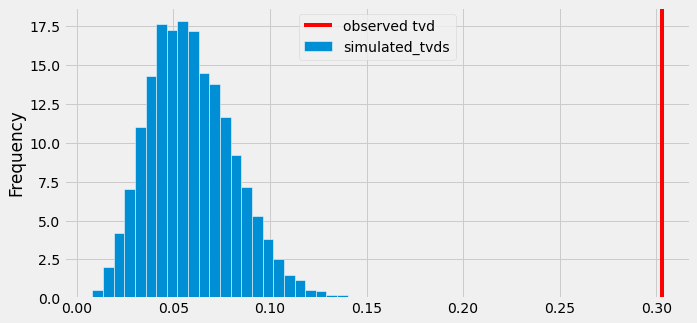

In [46]:
bpd.DataFrame().assign(simulated_tvds=tvd_stats).plot(kind='hist', density=True, bins=30, ec='w', figsize=(10, 5))
plt.axvline(x=tvd(observed_proportions, probabilities), color='red', label='observed tvd')
plt.legend();

### Question 4.4 (1 point)

Calculate the probability under the null hypothesis of observing a TVD that is at least as extreme as the one observed in actuality. Assign the name `tvd_p_value` to your answer.

In [47]:
tvd_p_value = np.count_nonzero(tvd_stats>=tvd(observed_proportions, probabilities))/10_000
tvd_p_value

0.0

In [48]:
grader.check("q4_4")

q4_4 results: All test cases passed!

### Question 4.5 (1 point)

As a refresher, here are our hypotheses:

- **Null Hypothesis**: The continents where meteorites are seen falling (since 1980) are generated by the distribution in `probabilities`, and any differences are due to random chance.
- **Alternative Hypothesis**: The continents where meteorites are seen falling (since 1980) are not generated by the distribution in `probabilities`.

Let's use a 0.05 significance level. What is the conclusion of our hypothesis test? Assign `prob_conclusion` to either 1, 2, 3, or 4.

1. We accept the null hypothesis.
2. We need more data to decide whether to accept the null hypothesis or not.
3. We reject the null hypothesis.
4. The null hypothesis is consistent with our observation.

In [49]:
prob_conclusion = 3

In [50]:
grader.check("q4_5")

q4_5 results: All test cases passed!

### Question 4.6 (1 point)

TVD, the test statistic we used in the previous hypothesis test, computes the distance between two categorical distributions. However, it turns out there are a variety of other test statistics that also compute the distance between two categorical distributions. One such statistic is what we'll call the <i>Maximum Distance (MD)</i>, which is defined as the **largest absolute difference between the proportions of any category**.

For example, consider the following two categorical distributions:

| Category | Distribution A | Distribution B |
| --- | --- | --- |
| 1 | 0.3 | 0.25 |
| 2 | 0.4 | 0.25 |
| 3 | 0.2 | 0.25 |
| 4 | 0.1 | 0.25 |

The absolute differences for each category are 0.05, 0.15, 0.05, and 0.15, and the largest of these is 0.15. So, the MD between Distribution A and Distribution B is 0.15.

Below, complete the implementation of the function `maximum_distance`, which takes in two arrays or Series of categorical distributions and returns the MD between them. Make sure to test your function on various inputs yourself.

In [51]:
def maximum_distance(a, b):
    a = np.array(a)
    b = np.array(b)
    return np.max(np.abs(a - b))

In [52]:
grader.check("q4_6")

q4_6 results: All test cases passed!

### Question 4.7 (3 points)

Let us now try and generalize the work you did to run a hypothesis test and compute a p-value like you did in Questions 4.3 and 4.4 but for **any** test statistic that computes the "distance" between two categorical distributions. Below, complete the implementation of the function `categorical_test`, which takes in
- `distance_fn`, a **function** that takes in two arrays/Series and returns some measure of the "distance" between the two arrays (like `maximum_distance`, or `tvd`), and
- `show_hist`, either `True` or `False`

`categorical_test` should run a hypothesis test for the null and alternative hypothesis established after Question 4.1, using `distance_fn` as the test statistic. Specifically, your function should:
- generate **10,000** simulated distributions using `generate_proportions()`,
- find the distance between each simulated distribution and `probabilities` using the `distance_fn` specified,
- compute and return a p-value, and
- draw a histogram with a red line if `show_hist` is `True`

For example, `categorical_test(maximum_distance, True)` should return the p-value for a hypothesis test that uses `maximum_distance` as the distance function and should draw a histogram of simulated maximum distances, with a red line at the observed maximum distance.

**_Hint 1:_** The code you write to implement `categorical_test` will look a lot like the code you wrote in 4.3 and 4.4. To draw the histogram, start by copying the plotting code we provided you with and change just the pieces that are necessary.

**_Hint 2:_** Remember that the argument `distance_fn` itself is a function that takes in two arguments. So, somewhere in your implementation of `categorical_test` you'll need to write `distance_fn(..., ...)`, where the blanks are replaced with arrays or Series.

0.0

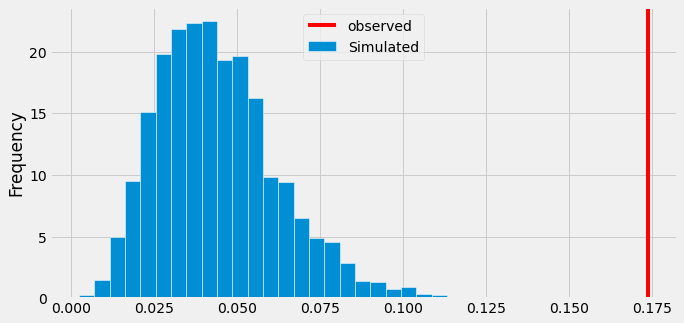

In [53]:
def categorical_test(distance_fn, show_hist):
    result = np.array([])
    for i in np.arange(10_000):
        result = np.append(result,distance_fn(generate_proportions(),probabilities))
    result_p = np.count_nonzero(result>=distance_fn(observed_proportions, probabilities))/10_000
    if show_hist==True:
        bpd.DataFrame().assign(Simulated=result).plot(kind='hist', density=True, bins=30, ec='w', figsize=(10, 5))
        plt.axvline(x=distance_fn(observed_proportions, probabilities), color='red', label='observed')
        plt.legend();
    return result_p
# If your function was implemented correctly, you should see a probability and a histogram below.
categorical_test(maximum_distance, True)

In [54]:
grader.check("q4_7")

q4_7 results: All test cases passed!

### Question 4.8 (1 point)

At the 0.05 significance level, is the conclusion of our hypothesis test that used MD as the test statistic the same as the conclusion of our hypothesis test that used TVD as the test statistic? Assign `md_same_as_tvd` to either `True` or `False` below.

In [55]:
md_same_as_tvd = True

In [56]:
grader.check("q4_8")

q4_8 results: All test cases passed!

### Question 4.9 (1 point)

The `categorical_test` function you implemented in 4.7 takes as an argument a distance function, `distance_fn`, which describes how "different" two categorical distributions are. Defining characteristics of a distance function are that:
- the distance between a distribution and itself is 0
- the distance between two different distributions is positive

Which of the following functions is **not** a valid distance function, according to the characteristics above? Assign `not_distance` to **a list** containing the options that are not valid distance functions. For example, if you believe options 1 and 2 are not valid distance functions, write `not_distance = [1, 2]`. If you believe all four options are valid distance functions, assign `not_distance` to an empty list.

```py
def option1(a, b):
    return np.mean((a - b) ** 2)
    
def option2(a, b):
    return np.mean((a - b) ** 3)
    
def option3(a, b):
    return len(a) * tvd(a, b)
    
def option4(a, b):
    return np.min((a + b) / 2 - 1)
```

In [57]:
not_distance = [2,4]

In [58]:
grader.check("q4_9")

q4_9 results: All test cases passed!

<a name='q5'></a>
## Question 5 – Around the World 🌏

Here's a potentially interesting observation: the median mass of meteorites seen falling in Asia is larger than the median mass of meteorites seen falling in North America.

Run the code below to convince yourself:

In [59]:
saw_fall[saw_fall.get('continent') == 'Asia'].get('mass').median()

2600.0

In [60]:
saw_fall[saw_fall.get('continent') == 'North America'].get('mass').median()

2111.87

Is there a real difference between the mass of meteorites seen falling in Asia and those seen falling in North America? Or is the observed difference solely due to random chance? Let's investigate this using a hypothesis test once again. Here are our hypotheses:

- **Null Hypothesis:** The masses of meteorites seen falling in Asia come from the same distribution as the masses of meteorites seen falling in North America. 
- **Alternative Hypothesis:** The median mass of meteorites seen falling in Asia is larger than the median mass of meteorites seen falling in North America.

Since we are comparing **two** numerical samples, we will conduct a permutation test. Make sure you understand why before proceeding.

### Question 5.1 (2 points)

Using the DataFrame `saw_fall` as a starting point, run a permutation test for the hypotheses stated above. As the test statistic, use the **difference in group medians** ( `'Asia'` minus `'North America'`). Run **1,000** permutations in your test. 

Our autograder will check that you define the following four variables:

- `asia_na`, a DataFrame that contains only the rows for `'Asia'` and `'North America'` and only the columns that are relevant for the permutation test
- `diff_medians`, an array of your 1000 simulated differences in group medians
- `observed_diff`, the observed difference in group medians
- `mass_p_value`, the p-value for this permutation test

Your code should take at most a few minutes to run.

In [61]:
asia_na = saw_fall[(saw_fall.get('continent')=='Asia')|(saw_fall.get('continent')=='North America')].get(['mass','continent'])
diff_medians = np.array([])
for i in np.arange(1000):
    shuffled_continent = np.random.permutation(asia_na.get('continent'))
    new_asia_na = asia_na.assign(Shuffled_Continent=shuffled_continent)
    differenc_5_1 = new_asia_na.groupby('Shuffled_Continent').median().get('mass').loc['Asia'] - new_asia_na.groupby('Shuffled_Continent').median().get('mass').loc['North America']
    diff_medians = np.append(diff_medians,differenc_5_1)
observed_diff = asia_na.groupby('continent').median().get('mass').loc['Asia'] - asia_na.groupby('continent').median().get('mass').loc['North America']
mass_p_value = np.count_nonzero(diff_medians>=observed_diff)/1000
mass_p_value

0.246

In [62]:
grader.check("q5_1")

q5_1 results: All test cases passed!

Run the cell below to visualize the distribution of our simulated differences in medians. You will see a histogram with a red line, which represents the observed difference in medians.

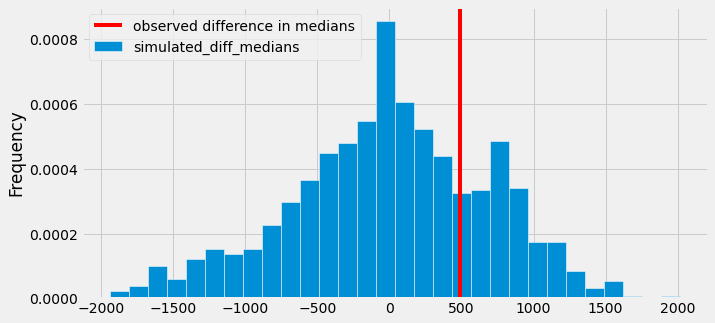

In [63]:
# Don't change it, just run
bpd.DataFrame().assign(simulated_diff_medians=diff_medians).plot(kind='hist', density=True, bins=30, ec='w', figsize=(10, 5))
plt.axvline(x=observed_diff, color='red', label='observed difference in medians')
plt.legend();

Under any reasonable cutoff, we'd fail to reject the null. Our data is consistent with the null hypothesis that the masses of meteorites that were seen falling in Asia and that were seen falling in North America come from the same distribution.

### Question 5.2 (3 points)

You may have noticed that we only used 1,000 repetitions in our previous permutation test. That's because the way that we've implemented permutation tests so far – repeatedly adding a column to a DataFrame and grouping – is quite slow.

**It turns out that there's a faster way to conduct a permutation test!**

Let's work through the general idea using an example. Suppose we have the following DataFrame, consisting of meteorites from `'Asia'` and `'North America'`:

| | **mass** | **continent** |
| --- | --- | --- |
| **0** | 4 | North America |
| **1** | 8 | Asia |
| **2** | 10 | Asia |
| **3** | 9 | North America |
| **4** | 11 | Asia |
| **5** | 6 | Asia |

This DataFrame has 6 meteorites in total – 4 from `'Asia'` and 2 from `'North America'`. The purpose of shuffling is to randomly assign the 6 masses to continents so that 4 belong to `'Asia'` and 2 belong to `'North America'` (remember, under the null hypothesis, masses of meteorites seen falling in both continents come from the same distribution). Here's one way to do that **and** calculate the relevant test statistic (difference between the `'Asia'` median mass and `'North America'` median mass), that doesn't involve using `.assign` or `.groupby`:

- First, shuffle the `'mass'` column.
- The first 4 values in the `'mass'` column are assigned to `'Asia'` – take their median and call that the median of the `'Asia'` group.
- The remaining 2 values in the `'mass'` column are assigned to `'North America'` - take their median and call that the median of the `'North America'` group.

For example, suppose we shuffle the `'mass'` column above and get `np.array([11, 10, 8, 9, 4, 6])`:
- The `'Asia'` masses would be 11, 10, 8, and 9. The median of these 4 is 9.5.
- The `'North America'` masses would be 4 and 6. The median of these 2 is 5.
- So our test statistic, **median `'Asia'` mass minus median `'North America'`** mass, is 9.5 - 5 = 4.5.

This method computes the same test statistic as our earlier permutation test, but works quicker under the hood.

<br>

Below, complete the implementation of the function `single_simulated_group_diff`, which takes in:
- `input_df`, a DataFrame with two columns `'mass'` and `'continent'`, made up of only meteorites from `'Asia'` and `'North America'`, and
- `func`, a function that takes in an array or Series and returns a number, like `np.median` or `np.mean` (think of this as a **statistic**)

The function `single_simulated_group_diff` should shuffle the `'mass'` column in `input_df` **just once**, and use the method outlined above to compute the difference in group **statistics** for that shuffled set of masses. The statistic you use should be computed using the passed in function `func`; for instance, if `func` is `np.median` you will compute the difference in group medians, and if `func` is `np.mean` you will compute the difference in group means. Regardless of what `func` is, you should compute the `'Asia'` statistic minus the `'North America'` statistic, as in 5.1.

**_Hint:_** To get the first `a` elements in the array `arr`, use `arr.take(np.arange(a))`. A crucial step in defining `single_simulated_group_diff` is determining the number of meteorites in `'Asia'` (or in `'North America'`).

In [64]:
def single_simulated_group_diff(input_df, func):
    Asia_total = input_df[input_df.get('continent')=='Asia'].shape[0]
    NA_total = input_df[input_df.get('continent')=='North America'].shape[0]   
    Shuffled = np.random.permutation(input_df.get('mass'))
    All_total = Asia_total + NA_total
    Asia_array = Shuffled.take(np.arange(Asia_total))
    NA_array = Shuffled.take(np.arange(All_total-NA_total,All_total))
    return func(Asia_array) - func(NA_array)

In [65]:
grader.check("q5_2")

q5_2 results: All test cases passed!

### Question 5.3 (1 point)

Write another function, `many_simulated_group_diffs`, that takes in 3 arguments, `input_df`, `func`, and `repetitions`. It should call your `single_simulated_group_diff` function `repetitions` times, each time with the arguments `input_df` and `func`. It should return an array of length `repetitions`, each element containing the value returned by a single call to `single_simulated_group_diff`.

In [66]:
def many_simulated_group_diffs(input_df, func, repetitions):
    result53 = np.array([])
    for i in np.arange(repetitions):
        result531 = single_simulated_group_diff(input_df, func)
        result53 = np.append(result53, result531)
    return result53    

In [67]:
grader.check("q5_3")

q5_3 results: All test cases passed!

If you answered everything correctly, then the following code should show a histogram similar to the one you saw after Question 5.1. **It should also run much quicker than your code from 5.1, showing how much quicker this alternative permutation test technique is compared to the "traditional" technique from class.**

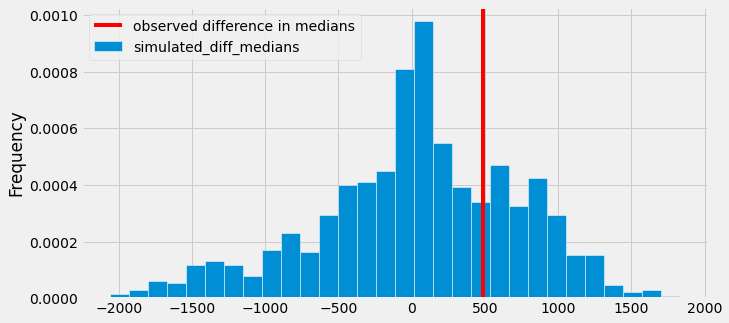

In [68]:
values = many_simulated_group_diffs(asia_na, np.median, 1000)
bpd.DataFrame().assign(simulated_diff_medians=values) \
               .plot(kind='hist',
                     density=True, 
                     ec='w', 
                     bins=30, 
                     figsize=(10, 5));
plt.axvline(x=observed_diff, color='red', label='observed difference in medians')
plt.legend();

So far, we've been using the difference in group **medians** as our test statistic. What if we instead want to use the difference in group **means** as the test statistics?

Fortunately, we can do this easily now with your `many_simulated_group_diffs` function:

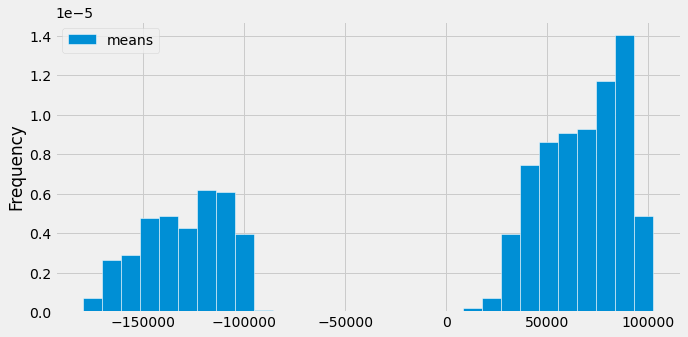

In [69]:
values = many_simulated_group_diffs(asia_na, np.mean, 1000)
bpd.DataFrame().assign(means=values) \
               .plot(kind='hist',
                     density=True, 
                     ec='w', 
                     bins=30, 
                     figsize=(10, 5));

There seem to be two "clusters" with a large gap between them when we use the difference in group means as our test statistic. Why is this? The answer can be seen by looking at `asia_na` when sorted by mass in descending order:

In [70]:
asia_na.sort_values('mass', ascending=False).take(np.arange(10))

,mass,continent
id,,
23593,23000000.0,Asia
12171,4000000.0,Asia
2278,2000000.0,North America
17922,1100000.0,North America
12379,1100000.0,Asia
12087,600000.0,Asia
18101,408000.0,North America
23724,325000.0,Asia
10059,320000.0,North America


### Question 5.4 (1 point)

Which of the following best explains why there is a gap in histogram of the empirical distribution of the differences in group **means** but  not in the histogram of the empirical distribution of the differences in group **medians**? Assign either 1, 2, 3, or 4 to `ans_5_4` below.
1. There is an issue with the bins that we've chosen for our histogram. If we choose narrower bins, we will not see a large gap.
2. Meteorites seen falling in Asia have a greater mean mass than meteorites seen falling in North America.
3. There is an outlier. The mean is affected greatly by an outlier, so whichever simulated group that the outlier is in will have the higher group mean. However, the group median is not affected by a single outlier.
4. There are more meteorites in one group than in the other, so after generating simulated groups, the group with more meteorites has a greater mean mass.

In [71]:
ans_5_4 = 3

In [72]:
grader.check("q5_4")

q5_4 results: All test cases passed!

### Question 5.5 (1 point)

Now, run the permutation test using the difference in group means as the test statistic, but remove the meteorite with the largest mass. Assign `diff_means` to an array of **10,000** simulated **differences in group means** (should only take one line to compute), and `mass_p_value_means` to the p-value of the permutation test.

**_Hint 1:_** It's a good idea to create a separate DataFrame that has all of the rows in `asia_na`, minus the row for the heaviest meteorite.

**_Hint 2:_** Use your `many_simulated_group_diffs` function to generate your simulated test statistics. To compute the observed statistic, you will have to group.

In [73]:
asia_na_without_largest = asia_na[asia_na.get('mass')!=asia_na.sort_values('mass', ascending=False).get('mass').iloc[0]]
diff_means = many_simulated_group_diffs(asia_na_without_largest, np.mean, 10000)
ovbserved55 = asia_na_without_largest.groupby('continent').mean().get('mass').loc['Asia']-asia_na_without_largest.groupby('continent').mean().get('mass').loc['North America']
mass_p_value_means = np.count_nonzero(diff_means>=ovbserved55)/10000
mass_p_value_means

0.6512

In [74]:
grader.check("q5_5")

q5_5 results: All test cases passed!

Run the cell below to see the differences in group means that you simulated.

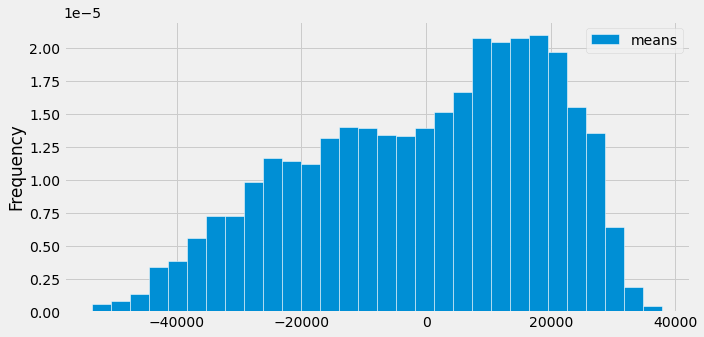

In [75]:
bpd.DataFrame().assign(means=diff_means) \
               .plot(kind='hist',
                     density=True, 
                     ec='w', 
                     bins=30, 
                     figsize=(10, 5));

That looks a lot more regular! Moral of the story – check for outliers before conducting statistical tests.

<a name='q6'></a>
## Question 6 – Confidence is Key 🔑

Consider once again the meteorites in the `saw_fall` DataFrame.

In [76]:
saw_fall

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,True,2900.0,1976,1970,39.66667,122.98333,Asia
30411,Zmenj,Howardite,True,246.0,1858,1850,51.83333,26.83333,Europe
30412,Zomba,L6,True,7500.0,1899,1890,-15.18333,35.28333,Africa


Again, `saw_fall` only contains the meteorites that were seen falling. However, it does not contain information about **all** meteorites that fell in a given continent, because many meteorites fell but were not seen. In this way, `saw_fall` contains a **sample** of the meteorites that fell in each continent.

As such, we might be interested in determining an estimate for the true median mass of all meteorites that have fallen in a given continent, given just the information in `saw_fall`. This sounds like a job for the bootstrap!

### Question 6.1 (2 points)

Let's start with `'North America'`. Below, assign `na_boot_median` to an array of **2,000** bootstrapped medians, each of which is the median of a bootstrapped resample of only the meteorites seen falling in `'North America'`. Then, assign `na_ci` to an array with two elements – the left and right endpoints of a 95% confidence interval for the true median mass of all meteorites that were seen falling in `'North America'`.

In [77]:
na_boot_medians = np.array([])
sample61 = saw_fall[saw_fall.get('continent')=='North America']
for i in np.arange(2000):
    resample61 = sample61.sample(sample61.shape[0], replace=True)
    medians = resample61.get('mass').median()
    na_boot_medians = np.append(na_boot_medians, medians)
na_left = np.percentile(na_boot_medians, 2.5)
na_right = np.percentile(na_boot_medians, 97.5)
na_ci = np.array([na_left, na_right])
na_ci

array([1477.5, 3400. ])

In [78]:
grader.check("q6_1")

q6_1 results: All test cases passed!

### Question 6.2 (1 point)

Now, generalize the work you did in the previous part. Define a function that takes in a `continent` and a number `p` and returns a p% confidence interval (stored as an **array** of two elements) for the median mass of meteorites in that continent. Again use **2000** resamples.

In [79]:
def continent_median_ci(continent, p):
    continent_boot_medians = np.array([])
    sample62 = saw_fall[saw_fall.get('continent')==continent]
    for i in np.arange(2000):
        resample62 = sample62.sample(sample62.shape[0], replace=True)
        medians = resample62.get('mass').median()
        continent_boot_medians = np.append(continent_boot_medians, medians)
    continent_left = np.percentile(continent_boot_medians, (100-p)/2)
    continent_right = np.percentile(continent_boot_medians, 100-((100-p)/2))
    continent_ci = np.array([continent_left, continent_right])
    return continent_ci

In [80]:
grader.check("q6_2")

q6_2 results: All test cases passed!

### Question 6.3 (2 points)

Which continent (of the ones represented in `saw_fall`) has the **widest** 95% confidence interval for the median mass of their meteorites? Assign the name of this continent to `widest_continent` below.

In [81]:
widest_continent = 'Australia'
widest_continent

'Australia'

In [82]:
grader.check("q6_3")

q6_3 results: All test cases passed!

### Question 6.4 (2 points)

Suppose we instead wanted to construct confidence intervals for the true **mean** mass of meteorites in a given continent. While we could use the bootstrap, we could also use the Central Limit Theorem, which holds only for means (and sums).

Again, let's first come up with a confidence interval for the mean mass of meteorites from one continent in particular. Assign `na_mean_ci` to an array with two elements – the left and right endpoints of a 95% confidence interval for the true mean mass of all meteorites that were seen falling in `'North America'`, generated using the Central Limit Theorem.

**_Hint:_** In a normal curve, 95% of values will be within (roughly) 2 standard deviations of the mean. Use this rule-of-thumb in your code.

In [83]:
test64 = saw_fall[saw_fall.get('continent')=='North America'].get('mass')
np.std(test64)
test64.median()

2111.87

In [84]:
sample_mean = saw_fall.groupby('continent').mean().get('mass').loc['North America']
q_6_4 = saw_fall[saw_fall.get('continent')=='North America'].get('mass')
q_6_4_1 = np.std(q_6_4)
na_mean_ci = np.array([sample_mean - 2*(q_6_4_1/(len(q_6_4))**0.5),sample_mean + 2*(q_6_4_1/(len(q_6_4))**0.5)])
na_mean_ci

array([12231.00634365, 64805.22754524])

In [85]:
grader.check("q6_4")

q6_4 results: All test cases passed!

Once again, let's try and generalize. We now want to compute a CLT-based p% confidence interval for the true mean mass of the meteorites that have fallen on any given continent, for a given percentage p.

In Question 6.4, we looked at values between 2 standard deviations of the mean, due to the rule-of-thumb that says 95% percent of values are within 2 standard deviations of the mean in a standard normal distribution. But how does this change if we want a p% confidence interval, for any value of p? 

It turns out that we need to look to `scipy.stat`'s `norm.ppf` function, which is the inverse of the function `norm.cdf`. Recall, `norm.cdf` takes in a value `z` in standard units and returns the proportion of values in a standard normal distribution that are less than or equal to `z`.

In [86]:
from scipy.stats import norm # Don't delete this!

norm.cdf(0)

0.5

Above, `norm.cdf(0)` evaluates to 0.5, because half of the area is to the left of 0 in a standard normal distribution (due to its symmetry).

`norm.ppf`, on the other hand, takes in a proportion `t` between 0 and 1 and returns the value `z` in standard units such that `t` of the values are less than or equal to `z`.

In [87]:
# At what value in standard units is 0.5 of the area to the left?
norm.ppf(0.5)

0.0

In [88]:
# At what value in standard units is 0.975 of the area to the left?
norm.ppf(0.975)

1.959963984540054

In [89]:
norm.ppf(0.025)

-1.9599639845400545

In [90]:
norm.ppf((1-0.95)/2)

-1.959963984540054

### Question 6.5 (1 point)

Below, complete the implementation of `find_z`, which takes in a **percentage** (not proportion!) `p` and returns the value `z` such that `p`% of values in a standard normal distribution are between -`z` and +`z` standard deviations of the mean.

For example, `find_z(68)` should be approximately 0.99, as 68% of values in a standard normal distribution are between -0.99 and +0.99 standard deviations of the mean. (Note that this matches very closely the rule-of-thumb that 68% of values are between 1 SD of the mean in a standard normal distribution.)

In addition, `find_z(95)` should be approximately 1.96, because 95% of values in a standard normal distribution are between -1.96 and +1.96 standard deviations of the mean. (Note that this matches very closely the rule-of-thumb that 95% of values are between 2 SDs of the mean in a standard normal distribution.)

**_Hint 1:_** Use `norm.ppf`, and refer to your implementation from Question 6.2.

**_Hint 2:_** Draw what a standard normal distribution looks like on paper.

In [91]:
def find_z(p):
    p = p/100
    return norm.ppf(1-((1-p)/2))
    '''Returns the value of z such that p% of values in a standard normal distribution are between -z and +z SDs.
       For example, `find_z(68)` should be close to 1 (0.99) and `find_z(95)` should be close to 2 (1.96). 
    '''
    
    
# Should be close to 0.99
find_z(68)

0.9944578832097535

In [92]:
grader.check("q6_5")

q6_5 results: All test cases passed!

### Question 6.6 (1 point)

Now, complete the implementation of the function `continent_mean_ci`, which takes in the name of a `continent` and a percentage `p`, and returns a two-element array containing the endpoints of a CLT-based `p`% confidence interval for the true mean mass of meteorites in that continent.

**_Hint:_** Use your `find_z` function. The code you write otherwise will look similar to the code you wrote in 6.4.

In [93]:
def continent_mean_ci(continent, p):
    sample_mean = saw_fall.groupby('continent').mean().get('mass').loc[continent]
    q_6_5 = saw_fall[saw_fall.get('continent')==continent].get('mass')
    q_6_5_1 = np.std(q_6_5)
    standard_units = find_z(p)
    left_percentile = sample_mean-(standard_units*(q_6_5_1/(len(q_6_5))**0.5))
    right_percentile = sample_mean+(standard_units*(q_6_5_1/(len(q_6_5))**0.5))
    return np.array([left_percentile, right_percentile])

In [94]:
grader.check("q6_6")

q6_6 results: All test cases passed!

Now that we have functions that can compute a p% confidence interval for both the median mass of meteorites fallen in a continent and the mean mass of meteorites fallen in a continent, let's use both functions on a single continent and interpret the results.

In [95]:
continent_median_ci('Europe', 95)

array([2534., 4000.])

In [96]:
continent_mean_ci('Europe', 95)

array([13854.99374428, 25871.45453974])

Why does the confidence interval for the mean contain much larger numbers than that of the median? (You don't need to answer this question anywhere, but do think about it!)

### Question 6.7 (1 point)

In the last few questions, we've operated under the assumption that `saw_fall` is a sample of the population of meteorites that have fallen and we used this to construct confidence intervals. In order for this confidence interval to be accurate, `saw_fall` should be a **random sample** of meteorites.

Is `saw_fall` likely a random sample of all meteorites that have ever fallen? Why or why not? Assign `sample_reflection` to either 1, 2, 3, or 4 below.

1. No, `saw_fall` is not likely a random sample of all meteorites that have ever fallen, because larger meteorites are more likely to be seen while falling than smaller meteorites.

2. No, `saw_fall` is not likely a random sample of all meteorites that have ever fallen, but it is likely a random sample of all meteorites that have fallen since 1980.

3. Yes, `saw_fall` is likely a random sample of all meteorites that have ever fallen, since the mass of meteorites has not changed over time and `saw_fall` is a large-enough sample.

4. Yes, `saw_fall` is likely a random sample of all meteorites that have ever fallen, because all meteorites are equally likely to be seen while falling.

In [97]:
sample_reflection = 1

In [98]:
grader.check("q6_7")

q6_7 results: All test cases passed!

<a name='q7'></a>
## Question 7 – Decade-nt 🍰

In this question – the final question of the project – we will explore whether there is a trend in the **median mass of meteorites over time**. As before, we will restrict our analysis to only the meteorites that were seen while falling (i.e. only the meteorites in `saw_fall`). Furthermore, we will only consider the meteorites that were seen falling since 1900 (including the year 1900).

### Question 7.1 (1 point)

Below, assign `seen_since_1900` to a DataFrame that contains only the meteorites that were seen falling since 1900 (including the year 1900).

In [99]:
saw_fall

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
1,Aachen,L5,True,21.0,1880,1880,50.77500,6.08333,Europe
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
...,...,...,...,...,...,...,...,...,...
30408,Zhuanghe,H5,True,2900.0,1976,1970,39.66667,122.98333,Asia
30411,Zmenj,Howardite,True,246.0,1858,1850,51.83333,26.83333,Europe
30412,Zomba,L6,True,7500.0,1899,1890,-15.18333,35.28333,Africa


In [100]:
seen_since_1900 = saw_fall[saw_fall.get('year')>=1900]
seen_since_1900

,name,recclass,seen_falling,mass,year,decade,latitude,longitude,continent
id,,,,,,,,,
2,Aarhus,H6,True,720.0,1951,1950,56.18333,10.23333,Europe
6,Abee,EH4,True,107000.0,1952,1950,54.21667,-113.00000,North America
10,Acapulco,Acapulcoite,True,1914.0,1976,1970,16.88333,-99.90000,North America
370,Achiras,L6,True,780.0,1902,1900,-33.16667,-64.95000,South America
379,Adhi Kot,EH4,True,4239.0,1919,1910,32.10000,71.80000,Asia
...,...,...,...,...,...,...,...,...,...
30399,Zemaitkiemis,L6,True,44100.0,1933,1930,55.30000,25.00000,Europe
30404,Zhaodong,L4,True,42000.0,1984,1980,45.81667,125.91667,Asia
30407,Zhovtnevyi,H6,True,107000.0,1938,1930,47.58333,37.25000,Europe


In [101]:
grader.check("q7_1")

q7_1 results: All test cases passed!

### Question 7.2 (0 points)

We define a "decadal median" to be the median mass of meteorites seen in a given decade.

Create a line chart that visualizes the decadal median over time, starting with the decade 1900.

**_Note:_** This question is ungraded, but you should complete it since it provides context for the rest of Question 7.

<!-- BEGIN QUESTION -->

<!--
BEGIN QUESTION
name: q7_2
manual: true
points: 0
-->

<AxesSubplot:xlabel='decade'>

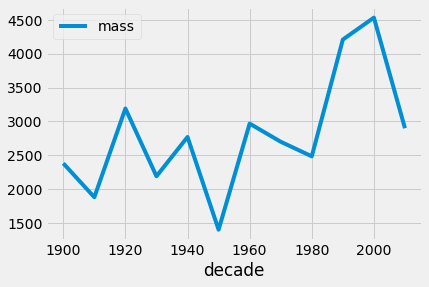

In [102]:
seen_since_1900.groupby('decade').median().plot(kind = 'line', y='mass')

<!-- END QUESTION -->



As seen above, it appears that some decadal medians were much larger than others. In particular, the 2000s decade seemed to have much heavier meteorites than other decades. Is this a real phenomenon or is it simply due to chance?

Our intuition tells us that a meteorite's mass should essentially be random. That is, when Mother Nature decides to throw a meteorite at Earth, it does not first check the year.

### Question 7.3 (2 points)

Let's test the following hypotheses:

- **Null Hypothesis**: The masses of meteorites in each decade are drawn from the same distribution, and the high median mass of meteorites from 2000 is solely due to random chance.
- **Alternative Hypothesis**: The high median mass of meteorites from 2000 is due to reasons other than random chance. 

For our test statistic, we'll use the **median mass of meteorites in a group**. 

Let's outline how we'll perform our hypothesis test. Let $n$ be the number of meteorites that were seen falling in the 2000s decade. Under the null hypothesis, values in the `'decade'` column have no relationship with values in the `'mass'` column. This means that we are able to repeatedly:
- randomly select $n$ meteorites from `seen_since_1900` (**without replacement**), and
- compute the median of their mass.

Under the null hypothesis, these medians should be close to the observed decadal median for the 2000s decade. Generate **1,000** values of the test statistic (median meteorite mass) using the above approach and place them in an array called `simulated_medians`.

**_Hint:_** First, assign `n` to the number of meteorites seen in the 2000s decade. If you later run into an error that says `Argument n is not an integer`, convert `n` to an integer by using `n = int(n)`.

In [103]:
simulated_medians = np.array([])
n = seen_since_1900[seen_since_1900.get('decade')==2000].shape[0]
for i in np.arange(1000):
    result73 = np.median(np.random.choice(seen_since_1900.get('mass'),n,replace=False))
    simulated_medians = np.append(simulated_medians, result73)
simulated_medians

array([2334.5 , 2835.  , 3609.5 , 1346.5 , 1342.1 , 2609.5 , 3228.5 ,
       3390.  , 2305.  , 3262.25, 5500.  , 3673.35, 1957.  , 1655.25,
       2141.  , 2899.  , 3326.  , 3673.5 , 3143.  , 3011.75, 1760.25,
       1905.  , 2210.5 , 1291.5 , 2565.  , 2665.  , 2462.5 , 3281.  ,
       2452.5 , 2763.  , 3929.  , 4209.5 , 4021.5 , 1487.  , 1480.  ,
       4555.  , 3253.5 , 3439.5 , 2872.  , 2500.  , 4692.5 , 2123.5 ,
       3478.5 , 3200.  , 2342.  , 3611.5 , 1700.  , 2885.  , 2330.  ,
       1620.  , 1436.5 , 1306.5 , 1850.  , 1407.5 , 2474.5 , 3738.  ,
       2347.  , 2500.  , 1600.  , 3478.5 , 2481.  , 2450.  , 2502.5 ,
       2750.  , 2956.5 , 2042.5 , 2878.  , 2940.5 , 2500.  , 2000.  ,
       1210.3 , 1715.  , 2225.  , 1670.  , 3448.  , 1333.1 , 1997.5 ,
       2862.25, 3758.5 , 3212.25, 3606.  , 2945.  , 3253.5 , 2452.5 ,
       3724.  , 1950.  , 2247.5 , 2019.5 , 2481.  , 3500.  , 3562.  ,
       2409.  , 2400.  , 1255.  , 2708.5 , 4170.  , 1496.5 , 3146.5 ,
       3586.5 , 3730

In [104]:
grader.check("q7_3")

q7_3 results: All test cases passed!

Run the cell below to see the empirical distribution of our test statistic. The distribution below represents the median masses we would expect to observe if meteorite masses are unrelated to decades. The observed median mass (of the 2000s decade) is located where the red vertical line is. 

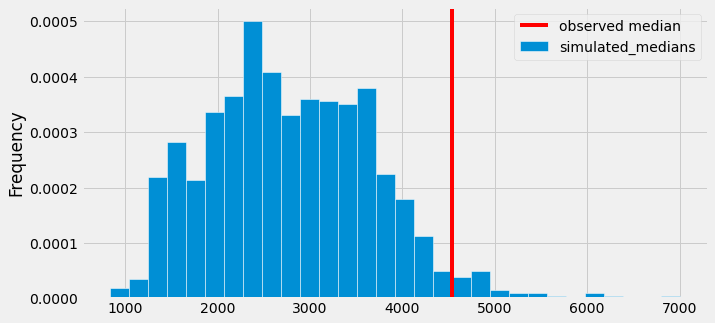

In [105]:
bpd.DataFrame().assign(simulated_medians=simulated_medians).plot(kind='hist', density=True, bins=30, ec='w', figsize=(10, 5))
plt.axvline(x=seen_since_1900[seen_since_1900.get('decade') == 2000].get('mass').median(), color='red', label='observed median')
plt.legend();

### Question 7.4 (1 point)

Finally, compute the p-value of the hypothesis test, and assign it to the variable `decadal_p_value`.

In [106]:
decadal_p_value = np.count_nonzero(simulated_medians>=seen_since_1900[seen_since_1900.get('decade') == 2000].get('mass').median())/1000
decadal_p_value

0.03

In [107]:
grader.check("q7_4")

q7_4 results: All test cases passed!

It appears that at the 0.05 significance level, we'd reject the null hypothesis that decade is unrelated to meteorite mass.

Why might the decadal median in 2000 be higher than earlier decadal medians? Perhaps due to the effects of global warming, it's becoming harder to see smaller meteorites, and hence the ones that we see are heavier. Or perhaps there are systemic errors in how the data were recorded. What are other reasons you can come up with? 🤔

## Finish Line 🏁

Congratulations! You've completed the Final Project, your last assignment for DSC 10 this quarter! 🎉

To submit your assignment:

1. Select `Kernel -> Restart & Run All` to ensure that you have executed all cells, including the test cells. <p style="color: red"><b>Important!</b> We will allot 20 minutes of computer time to run your notebook. If your notebook takes longer than this to run, it may not pass the autograder! Run "Kernel -> Restart and Run All" to time how long your notebook takes. A notebook with correct answers should take less than 5 minutes.</p>
2. Read through the notebook to make sure everything is fine and all tests passed.
3. Run the cell below to run all tests, and make sure that they all pass.
4. Download your notebook using `File -> Download as -> Notebook (.ipynb)`, then upload your notebook to Gradescope.
5. If you worked with a partner, select your partner on Gradescope after submitting. **Only one of you needs to submit!**

In [108]:
grader.check_all()

q1_1 results: All test cases passed!

q1_2 results: All test cases passed!

q2_1 results: All test cases passed!

q2_2 results: All test cases passed!

q2_3 results: All test cases passed!

q3_1 results: All test cases passed!

q3_2 results: All test cases passed!

q3_3 results: All test cases passed!

q3_4 results: All test cases passed!

q3_5 results: All test cases passed!

q3_6 results: All test cases passed!

q4_1 results: All test cases passed!

q4_2 results: All test cases passed!

q4_3 results: All test cases passed!

q4_4 results: All test cases passed!

q4_5 results: All test cases passed!

q4_6 results: All test cases passed!

q4_7 results: All test cases passed!

q4_8 results: All test cases passed!

q4_9 results: All test cases passed!

q5_1 results: All test cases passed!

q5_2 results: All test cases passed!

q5_3 results: All test cases passed!

q5_4 results: All test cases passed!

q5_5 results: All test cases passed!

q6_1 results: All test cases passed!

q6_2 results